In [152]:
from random import gauss as gs
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats
from statsmodels.formula.api import ols
from datetime import datetime, timedelta
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import TimeSeriesSplit

from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import acf, pacf, adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.statespace.sarimax import SARIMAX

from statsmodels.graphics import tsaplots
import statsmodels.api as sm
import plotly.graph_objects as go

In [79]:
!pip install plotly

  Obtaining dependency information for plotly from https://files.pythonhosted.org/packages/a8/07/72953cf70e3bd3a24cbc3e743e6f8539abe6e3e6d83c3c0c83426eaffd39/plotly-5.18.0-py3-none-any.whl.metadata
  Obtaining dependency information for tenacity>=6.2.0 from https://files.pythonhosted.org/packages/f4/f1/990741d5bb2487d529d20a433210ffa136a367751e454214013b441c4575/tenacity-8.2.3-py3-none-any.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.6/15.6 MB 18.9 MB/s eta 0:00:0000:0100:01


# Definitions 

In [249]:
def plot_timeseries(ts, title = 'og', opacity = 1):
    """
    Plot plotly time series of any given timeseries ts
    """
    fig = go.Figure()

    fig.add_trace(go.Scatter(x = ts.index, y = ts.values, name = "observed",
                         line_color = 'lightslategrey', opacity = opacity))

    fig.update_layout(title_text = title,
                  xaxis_rangeslider_visible = True)
    fig.show()

In [153]:
#Loading the previously saved hourly energy for SDGE and SDGE hourly merged with weather data
SDGE_T = pd.read_csv('hourly_SDGE.csv')

In [156]:
SDGE_T = SDGE_T.drop('Date', axis=1)
SDGE_T.set_index("datetime", inplace =True)

In [157]:
SDGE_T.head()

,SDGE,year,month,day,hour,weekday,season,holiday
datetime,,,,,,,,
2019-01-01 00:00:00,2372.497411,2019,1,1,0,Tuesday,winter,1
2019-01-01 01:00:00,2698.751137,2019,1,1,1,Tuesday,winter,0
2019-01-01 02:00:00,2777.672120,2019,1,1,2,Tuesday,winter,0
2019-01-01 03:00:00,2799.193829,2019,1,1,3,Tuesday,winter,0
2019-01-01 04:00:00,2761.883322,2019,1,1,4,Tuesday,winter,0


# Time series structures
>- Hourly

In [158]:
# Creating a simple time series dataframe
th_sdge = pd.DataFrame(SDGE_T["SDGE"], columns=['SDGE'])

In [159]:
th_sdge.head()

,SDGE
datetime,
2019-01-01 00:00:00,2372.497411
2019-01-01 01:00:00,2698.751137
2019-01-01 02:00:00,2777.672120
2019-01-01 03:00:00,2799.193829
2019-01-01 04:00:00,2761.883322


2019-01-01 00:00:00     43.285239
2019-01-01 01:00:00    149.527611
2019-01-01 02:00:00    330.518297
2019-01-01 03:00:00    351.247265
2019-01-01 04:00:00    407.755806
Freq: H, Name: seasonal, dtype: float64


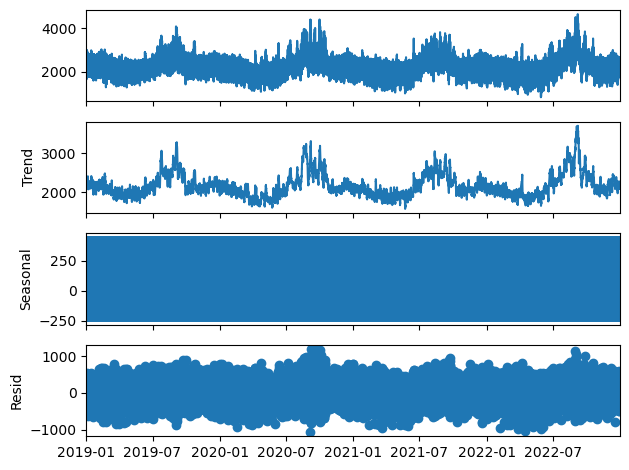

In [232]:
# Specify the start and end dates within the range of the data 
start_date = th_sdge.index[0] 
end_date = th_sdge.index[-1]  
# Create a DateTimeIndex with a frequency of 1 hour 
index = pd.date_range(start=start_date, end=end_date, freq='H')  
# Create a Series with the 'SDGE' column and the DateTimeIndex 
sdge_th = pd.Series(th_sdge['SDGE'].values, index=index)  
# Run seasonal decomposition 
decomp = sm.tsa.seasonal_decompose(sdge_th)  
# Print the first few values of the seasonal component 
print(decomp.seasonal.head())  
# Plot the decomposition 
_ = decomp.plot() 

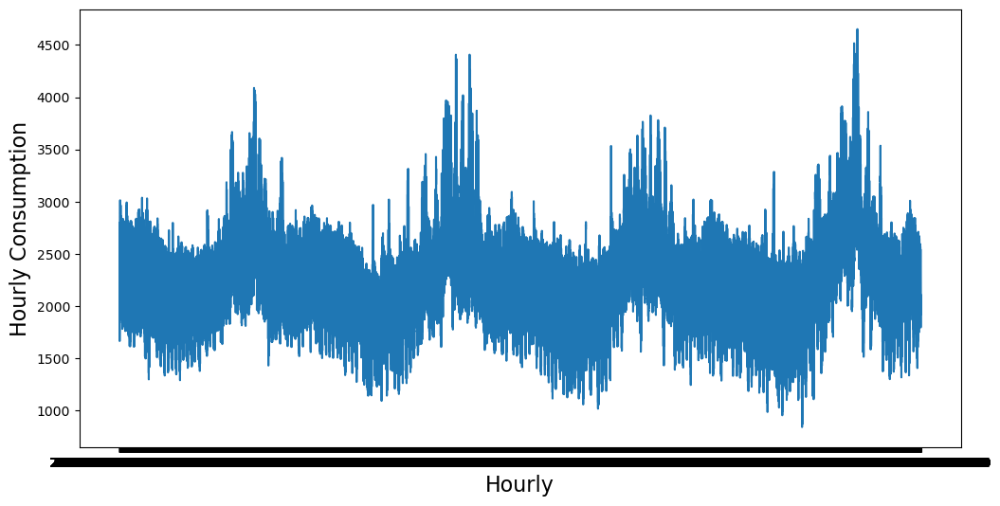

In [163]:
fig = plt.figure(figsize=(12, 6))
plt.plot(th_sdge)
plt.xlabel("Hourly", fontsize=16)
plt.ylabel("Hourly Consumption", fontsize=16)
plt.show()

In [251]:
sdge_th['seasonal'] = decomp.seasonal

In [250]:
# Plotting the seasonal coponent only
plot_timeseries(th_sdge['seasonal'], title = 'Seasonal component')

## Testing for stationary
Based on the provided information, the test statistic is -8.697959e+00 and the p-value is 3.878533e-14. 
If the p-value is less than the significance level (commonly 0.05), we reject the null hypothesis 
and conclude that the time series is stationary. 

In this case, the p-value (3.878533e-14) is much smaller than the significance level (0.05), 
indicating strong evidence against the null hypothesis. We can therefore conclude that the time series is stationary.

In [164]:
th_test = adfuller(sdge_th)
display(th_test)

(-8.69795881318699,
 3.878533167943309e-14,
 52,
 35011,
 {'1%': -3.43053679213716,
  '5%': -2.8616225575095284,
  '10%': -2.566813942767471},
 475245.4656370086)

In [165]:
# Extract and display test results in a user friendly manner
dfoutput = pd.Series(
                th_test[0:4], 
                index=['Test Statistic','p-value','#Lags Used','Number of Observations Used']
)

for key,value in th_test[4].items():
    dfoutput['Critical Value (%s)'%key] = value
    
display(dfoutput)

Test Statistic                -8.697959e+00
p-value                        3.878533e-14
#Lags Used                     5.200000e+01
Number of Observations Used    3.501100e+04
Critical Value (1%)           -3.430537e+00
Critical Value (5%)           -2.861623e+00
Critical Value (10%)          -2.566814e+00
dtype: float64

### Daily

In [172]:
td_sdge = pd.DataFrame(SDGE_T["SDGE"], columns=['SDGE'])

In [173]:
td_sdge

,SDGE
datetime,
2019-01-01 00:00:00,2372.497411
2019-01-01 01:00:00,2698.751137
2019-01-01 02:00:00,2777.672120
2019-01-01 03:00:00,2799.193829
2019-01-01 04:00:00,2761.883322
...,...
2022-12-31 19:00:00,1848.860000
2022-12-31 20:00:00,1857.700000
2022-12-31 21:00:00,2035.800000


In [174]:
td_sdge.info()

<class 'pandas.core.frame.DataFrame'>
Index: 35064 entries, 2019-01-01 00:00:00 to 2022-12-31 23:00:00
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   SDGE    35064 non-null  float64
dtypes: float64(1)
memory usage: 547.9+ KB


In [176]:
# Convert index to datetime format 
td_sdge.index = pd.to_datetime(td_sdge.index)  
# Resample to daily frequency and calculate mean 
td_sdge = td_sdge.resample('D').mean() 

2019-01-01     61.832640
2019-01-02     60.913453
2019-01-03     61.671525
2019-01-04     28.503452
2019-01-05   -111.327743
Freq: D, Name: seasonal, dtype: float64


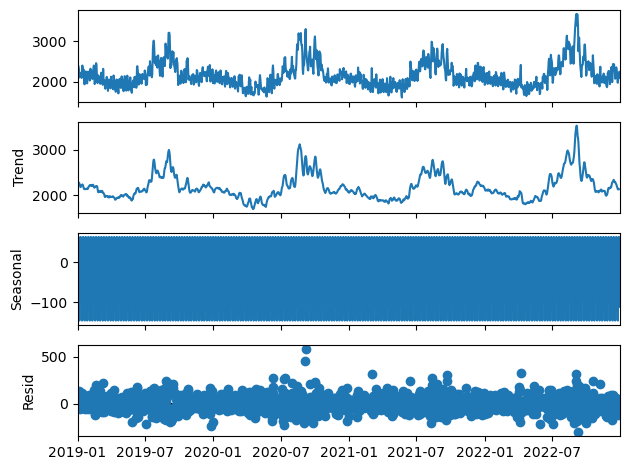

In [177]:
# Specify the start and end dates within the range of the data 
start_date = td_sdge.index[0] 
end_date = td_sdge.index[-1]  
# Create a DateTimeIndex with a frequency of 1 hour 
index = pd.date_range(start=start_date, end=end_date, freq='D')  
# Create a Series with the 'SDGE' column and the DateTimeIndex 
td_sdge = pd.Series(td_sdge['SDGE'].values, index=index)  
# Run seasonal decomposition 
decomp = sm.tsa.seasonal_decompose(td_sdge)  
# Print the first few values of the seasonal component 
print(decomp.seasonal.head())  
# Plot the decomposition 
_ = decomp.plot() 

>- Daily stationary status

In [179]:
td_test = adfuller(td_sdge)
display(td_test)

(-3.152514268847381,
 0.02290319689547403,
 21,
 1439,
 {'1%': -3.4349024693573584,
  '5%': -2.8635506057382325,
  '10%': -2.5678404322793846},
 17459.226734458396)

In [180]:
for key,value in td_test[4].items():
    dfoutput['Critical Value (%s)'%key] = value
    
display(dfoutput)

Test Statistic                -8.697959e+00
p-value                        3.878533e-14
#Lags Used                     5.200000e+01
Number of Observations Used    3.501100e+04
Critical Value (1%)           -3.434902e+00
Critical Value (5%)           -2.863551e+00
Critical Value (10%)          -2.567840e+00
dtype: float64

### Weekly

In [186]:
tw_sdge = pd.DataFrame(SDGE_T["SDGE"], columns=['SDGE'])

In [187]:
# Convert index to datetime format 
tw_sdge.index = pd.to_datetime(tw_sdge.index)  
# Resample to weekly frequency and calculate mean 
tw_sdge = tw_sdge.resample('W').mean() 

2019-01-06   -41.327466
2019-01-13   -20.950110
2019-01-20   -44.980603
2019-01-27   -67.622577
2019-02-03   -45.524346
Freq: W-SUN, Name: seasonal, dtype: float64


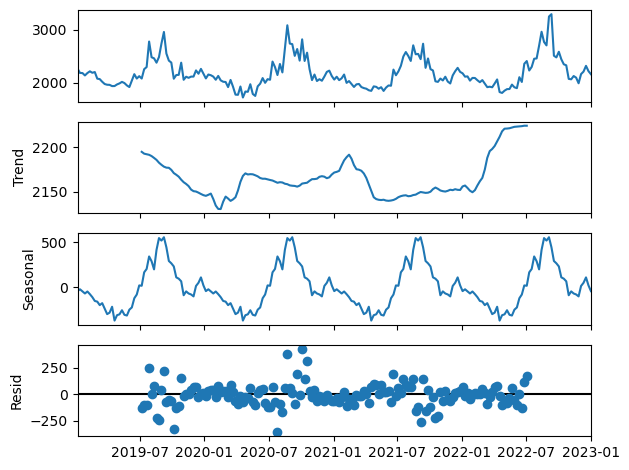

In [189]:
# Specify the start and end dates within the range of the data 
start_date = tw_sdge.index[0] 
end_date = tw_sdge.index[-1]  
# Create a DateTimeIndex with a frequency of 1 hour 
index = pd.date_range(start=start_date, end=end_date, freq='W')  
# Create a Series with the 'SDGE' column and the DateTimeIndex 
tw_sdge = pd.Series(tw_sdge['SDGE'].values, index=index)  
# Run seasonal decomposition 
decomp = sm.tsa.seasonal_decompose(tw_sdge)  
# Print the first few values of the seasonal component 
print(decomp.seasonal.head())  
# Plot the decomposition 
_ = decomp.plot() 

>- Weekly stationary

In [191]:
tw_test = adfuller(tw_sdge)
display(tw_test)

(-4.822109515634576,
 4.9329760354863376e-05,
 7,
 201,
 {'1%': -3.4633090972761744,
  '5%': -2.876029332045744,
  '10%': -2.5744932593252643},
 2484.005492816163)

In [192]:
for key,value in tw_test[4].items():
    dfoutput['Critical Value (%s)'%key] = value
    
display(dfoutput)

Test Statistic                -8.697959e+00
p-value                        3.878533e-14
#Lags Used                     5.200000e+01
Number of Observations Used    3.501100e+04
Critical Value (1%)           -3.463309e+00
Critical Value (5%)           -2.876029e+00
Critical Value (10%)          -2.574493e+00
dtype: float64

### Monthly

In [193]:
tm_sdge = pd.DataFrame(SDGE_T["SDGE"], columns=['SDGE'])

In [194]:
# Convert index to datetime format 
tm_sdge.index = pd.to_datetime(tm_sdge.index)  
# Resample to daily frequency and calculate mean 
tm_sdge = tm_sdge.resample('M').mean() 

2019-01-31    -50.599983
2019-02-28   -127.433425
2019-03-31   -229.471950
2019-04-30   -292.418495
2019-05-31   -287.704334
Freq: M, Name: seasonal, dtype: float64


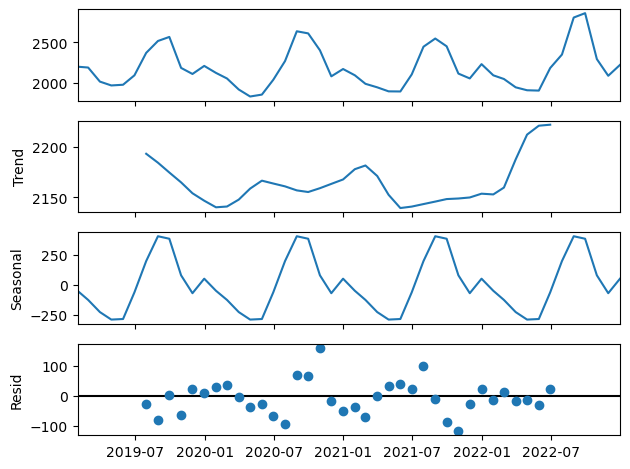

In [195]:
# Specify the start and end dates within the range of the data 
start_date = tm_sdge.index[0] 
end_date = tm_sdge.index[-1]  
# Create a DateTimeIndex with a frequency of 1 hour 
index = pd.date_range(start=start_date, end=end_date, freq='M')  
# Create a Series with the 'SDGE' column and the DateTimeIndex 
tm_sdge = pd.Series(tm_sdge['SDGE'].values, index=index)  
# Run seasonal decomposition 
decomp = sm.tsa.seasonal_decompose(tm_sdge)  
# Print the first few values of the seasonal component 
print(decomp.seasonal.head())  
# Plot the decomposition 
_ = decomp.plot() 

In [196]:
tm_test = adfuller(tm_sdge)
display(tm_test)

(-1.4759501957019538,
 0.5453731225370553,
 10,
 37,
 {'1%': -3.6209175221605827,
  '5%': -2.9435394610388332,
  '10%': -2.6104002410518627},
 466.06945982473326)

In [197]:
for key,value in tm_test[4].items():
    dfoutput['Critical Value (%s)'%key] = value
    
display(dfoutput)

Test Statistic                -8.697959e+00
p-value                        3.878533e-14
#Lags Used                     5.200000e+01
Number of Observations Used    3.501100e+04
Critical Value (1%)           -3.620918e+00
Critical Value (5%)           -2.943539e+00
Critical Value (10%)          -2.610400e+00
dtype: float64

### Yearly

In [209]:
ty_sdge = pd.DataFrame(SDGE_T["SDGE"], columns=['SDGE'])

In [210]:
# Convert index to datetime format 
ty_sdge.index = pd.to_datetime(ty_sdge.index)  
# Resample to daily frequency and calculate mean 
ty_sdge = ty_sdge.resample('Y').mean() 

datetime
2019-12-31    0.0
2020-12-31    0.0
2021-12-31    0.0
2022-12-31    0.0
Freq: A-DEC, Name: seasonal, dtype: float64


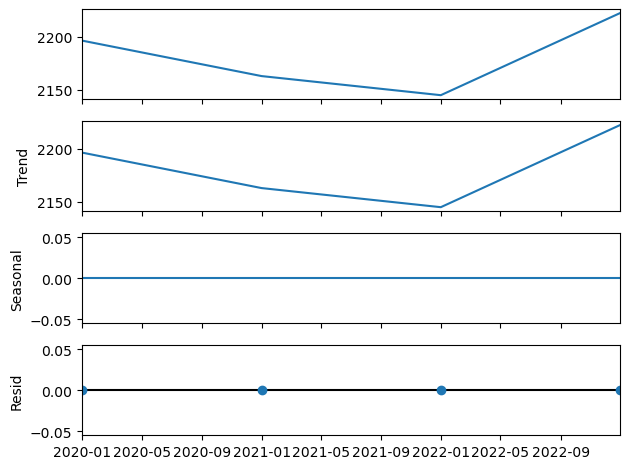

In [211]:
 decomp = sm.tsa.seasonal_decompose(ty_sdge)  
# Print the first few values of the seasonal component 
print(decomp.seasonal.head())  
# Plot the decomposition 
_ = decomp.plot() 

In [202]:
ty_test = adfuller(ty_sdge)
display(ty_test)

(-1.5732998397519342,
 0.49699048516316247,
 0,
 3,
 {'1%': -10.41719074074074,
  '5%': -5.77838074074074,
  '10%': -3.391681111111111},
 32.137375964462564)

In [203]:
for key,value in ty_test[4].items():
    dfoutput['Critical Value (%s)'%key] = value
    
display(dfoutput)

Test Statistic                -8.697959e+00
p-value                        3.878533e-14
#Lags Used                     5.200000e+01
Number of Observations Used    3.501100e+04
Critical Value (1%)           -1.041719e+01
Critical Value (5%)           -5.778381e+00
Critical Value (10%)          -3.391681e+00
dtype: float64

# Exponential Smoothing

In [240]:
ts_sdge = pd.DataFrame(SDGE_TW["SDGE"], columns=['SDGE'])

In [252]:
# Defining a function to plot exponentially smoothed data
def plot_ewma(ts, alpha):
    expw_ma = ts.ewm(alpha=alpha).mean()
    
    plot_ts_pred(ts, expw_ma, model_name='Exponentially smoothed data with alpha = {}'.format(alpha), \
                 og_ts_opacity = 0.5, pred_ts_opacity = 0.5)

In [253]:
# Plotting the exponentially smoothed energy consumption data with alpha=0.3
plot_ewma(ts_sdge['SDGE'], 0.3)

# Autocorrelation

In [243]:
def acf_pacf_plots(ts, lags, figsize = (12,8)):
    
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize = figsize)
    
    # Plot the ACF of ts
    _ = plot_acf(ts, lags = lags, zero = False, ax = ax1, alpha = 0.05)

    # Plot the PACF of ts
    _ = plot_pacf(ts, lags = lags, zero = False, ax = ax2, alpha = 0.05)

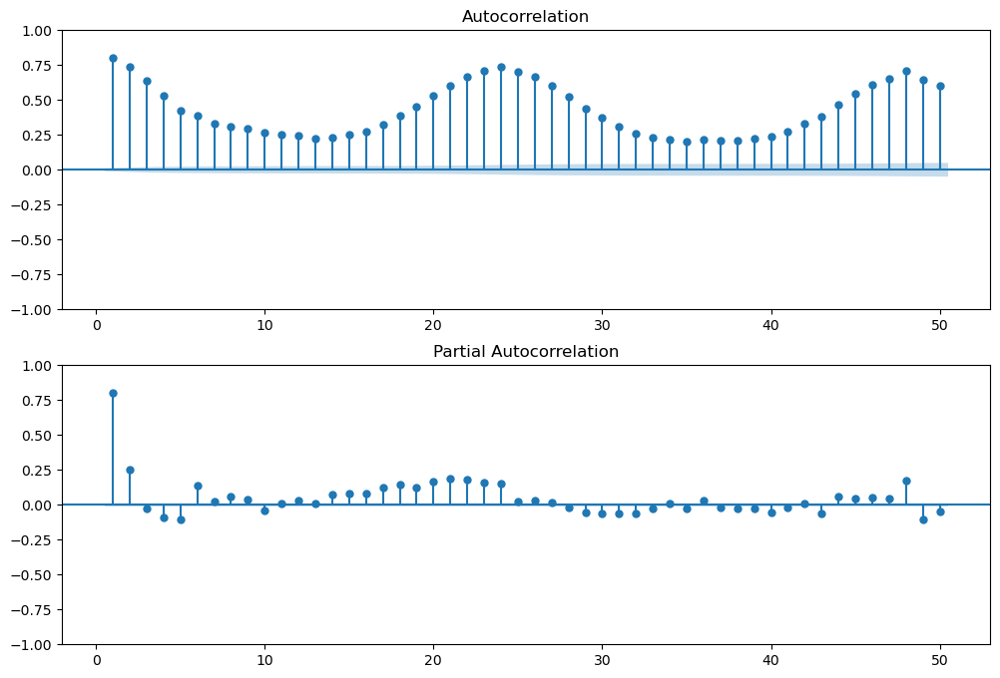

In [244]:
# Create the acf and pacf plots

dfacf = []
dfacf = ts_sdge['SDGE']
lags = 50

acf_pacf_plots(dfacf, lags = lags, figsize = (12,8))

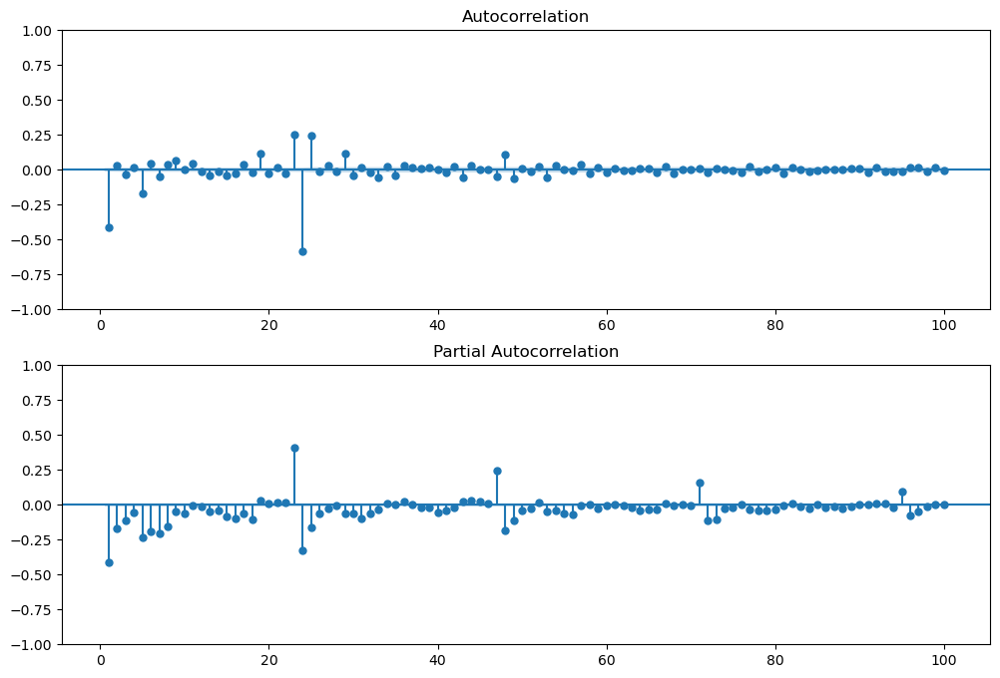

In [245]:
# Differencing the data this time to remove the trend and seasonality
dfacf = []
dfacf = ts_sdge['SDGE']
dfacf = dfacf.diff().dropna() 
dfacf = dfacf.diff(24).dropna()
dfacf = dfacf.diff(24*365).dropna()
lags = 100

acf_pacf_plots(dfacf, lags = lags, figsize = (12,8))